In [1]:
from Portfolio.portfolio import *
import matplotlib.pyplot as plt
from statsmodels.sandbox.regression.predstd import wls_prediction_std
import statsmodels.formula.api as sm
from itertools import product


In [16]:
#Splits the years into rolling histories by quarter
quarter_pairs = [('-01-01', '-03-31'), ('-04-01', '-06-30'), ('-07-01', '-09-30'), ('-10-01', '-12-31')]
years= ['2006', '2007', '2008', '2009', '2010', '2011', '2012',
       '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']

quarters_list = []
for year in years:
    for q_start, q_end in quarter_pairs:
        period_end = year[:4] + q_end
        period_start = year[:4] + q_start
        quarters_list.append((period_start, period_end))

print(len(quarters_list))

windows_by_quarters = {}
rolling_window = []
for idx in range(0, 61):
    period_start = quarters_list[idx]
    period_end = quarters_list[idx+1]
    period = (period_start[0],period_end[1])

    # make the rolling periods
    rolling_window.append(period)

    # assign quarters to the window they are in
    windows_by_quarters[period] = quarters_list[idx:(idx+2)]

ticks = rolling_window
rolling_window = rolling_window[:59]

64


In [17]:
# Make arrays for plotting

x_values = []
x_ticks = []
first_quarter_x_ticks = []
for idx, (period_start, period_end) in enumerate(ticks):
    #x_values.append(tuples[0][5:10]+'-'+tuples[0][2:4]+' to '+tuples[1][5:10]+'-'+tuples[1][2:4])
    x_values.append('Period '+str(idx+1))
    if idx%4 == 0:
        x_ticks.append(None)
        first_quarter_x_ticks.append('\''+period_start[2:4]+'Q'+str((idx%4)+1))
    else:
        x_ticks.append(str((idx%4)+1))
# q_values = x_values
x_values = x_values[:59]

In [18]:

ticks = []
for idx in range(0, 61):
    period_start = quarters_list[idx]
    period_end = quarters_list[idx+3]
    period = (period_start[0],period_end[1])

    # make the rolling periods
    ticks.append(period)

    # assign quarters to the window they are in


x_ticks = []
first_quarter_x_ticks = []
for idx, (period_start, period_end) in enumerate(ticks):
    #x_values.append(tuples[0][5:10]+'-'+tuples[0][2:4]+' to '+tuples[1][5:10]+'-'+tuples[1][2:4])
    if idx%4 == 0:
        x_ticks.append(None)
        first_quarter_x_ticks.append('\''+period_start[2:4]+'Q'+str((idx%4)+1))
    else:
        x_ticks.append(str((idx%4)+1))
x_ticks = x_ticks[:61]




In [20]:

# Numbers taken from https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=billRatesYear

mu_si = np.array([4.17, 4.67, 5.09, 4.88,
                  5.07, 4.91, 4.95, 3.93,
                  3.26, 1.4, 1.87, .85, 
                  .08, .22, .17, .1,
                  .08, .16, .17, .16, 
                  .15, .07, .02, .02, 
                  .02, .08, .1, .09,
                  .08, .08, .04, .02, 
                  .07, .05, .02, .02, 
                  .02, .03, .01, .02,
                  .22, .23, .27, .32, 
                 .54, .79, 1.06, 1.02,
                 1.44, 1.77, 1.99, 2.23, 
                 2.42, 2.43, 2.21, 1.82, 
                 .09, .14, .09, 1.54])/(100)

mu_cl = np.add(mu_si, [.03]*60)
mu_si = mu_si/252
mu_cl = mu_cl/252

mu_safe = {}
mu_credit = {}

for idx, year_period in enumerate(rolling_window):
    mu_safe[year_period] = mu_si[idx]
    mu_credit[year_period] = mu_cl[idx]

mu_si = mu_safe
mu_cl = mu_credit


In [6]:
# Get the portfolio
groupABC = Portfolio(['VFIAX', 'VBTLX', 'VGSLX', 'VGTSX', 'VIMAX', 'VSMAX', 'GOOGL', 'MSFT', 'ADBE'])

[*********************100%***********************]  9 of 9 completed


In [21]:

#First, compute all of the allocation parameters. f_st, f_ct, f_lt for each of the 57 periods.

mv_params={}
st_params={}
ct_params={}
lt_params={}

f_mv={}
f_st={}
f_ct={}
f_lt={}

mean_and_variance = {}

for period_start, period_end in rolling_window:
    period = (period_start, period_end)
    mu_si_period = mu_si[period]

    m, V = mean_and_variance_period = mean_and_variance[period] = groupABC.get_mean_and_variance(period_start, period_end)
    mv_params_period = mv_params[period] = groupABC.get_minimum_volatility_portfolio_parameters(period_start, period_end)
    y = compute_y(V)
    z = compute_z(m, V)
    st_params[period] = safe_tangent_portfolio_parameters(mu_si_period, y, z, mv_params_period)
    ct_params[period] = credit_tangent_portfolio_parameters(mu_cl[period], y, z, mv_params_period)
    lt_params[period] = long_tangent_portfolio_parameters(mu_si_period, mean_and_variance_period)

    f_mv[period] = mv_params[period][0]
    f_st[period] = st_params[period][0]
    f_lt[period] = lt_params[period][0]
    f_ct[period] = None
    if ct_params[period] is not None:
        f_ct[period] = ct_params[period][0]



In [22]:
# Establish the data types to store our metrics

index = rolling_window

w_SN_lt = pd.Series(index=index, dtype= np.float64)
w_SN_st = pd.Series(index=index, dtype= np.float64)

w_KS_st = pd.Series(index=index, dtype= np.float64)
w_KS_lt = pd.Series(index=index, dtype= np.float64)
w_m_st = pd.Series(index=index, dtype= np.float64)
w_m_lt = pd.Series(index=index, dtype= np.float64)
w_V_st = pd.Series(index=index, dtype= np.float64)
w_V_lt = pd.Series(index=index, dtype= np.float64)

w_prox_VFIAX = pd.Series(index=index, dtype= np.float64)
w_prox_lt = pd.Series(index=index, dtype= np.float64)

w_lev_st = pd.Series(index=index, dtype= np.float64)
w_lev_ct = pd.Series(index=index, dtype= np.float64)

SN_metrics = { 'w_SN_lt' : w_SN_lt, 'w_SN_st' : w_SN_st }
ID_metrics = { 'w_KS_st' : w_KS_st, 'w_KS_lt' : w_KS_lt, 'w_m_st' : w_m_st, 'w_m_lt' : w_m_lt, 'w_V_st' : w_V_st, 'w_V_lt' : w_V_lt }
prox_metrics = { 'w_prox_lt' : w_prox_lt, 'w_prox_VFIAX' : w_prox_VFIAX }
lev_metrics = { 'w_lev_ct' : w_lev_ct, 'w_lev_st' : w_lev_st  }

In [23]:
#compute the SNR

for period_start, period_end in rolling_window:
    period = (period_start, period_end)
    m, V = mean_and_variance[period]
    weights = pd.Series(np.ones(groupABC.returns[period_start:period_end].size)/groupABC.returns[period_start:period_end].size)
    w_bar = (weights ** 2).sum()

    # safe tangent portfolio allocation
    mu_hat = (m.T @ f_st[period]) ** 2
    sigma_hat = f_st[period].T @ V @ f_st[period]
    sigma_hat_w_bar = w_bar * sigma_hat
    w_SN_st[period] = (mu_hat / (sigma_hat_w_bar+ mu_hat))

    # long tangent portfolio allocation
    mu_hat = (m.T @ f_lt[period]) ** 2
    sigma_hat = f_lt[period].T @ V @ f_lt[period]
    sigma_hat_w_bar = w_bar * sigma_hat
    w_SN_lt[period] = (mu_hat / (sigma_hat_w_bar+ mu_hat))


In [24]:
for period in rolling_window:

    returns = groupABC.returns[period[0]:period[1]]

    f_lt_period = f_lt[period]
    f_st_period = f_st[period]
    mu_si_period = mu_si[period]

    portfolio_returns_lt = (1-f_lt_period.sum())*mu_si_period + (f_lt_period.T @ returns.T)
    portfolio_returns_st = (1-f_st_period.sum())*mu_si_period + (f_st_period.T @ returns.T)

    ### Compute the KS metrics ###

# Compute KS for f_st
    returns_arr = []
    for q_start, q_end in windows_by_quarters[period]:
        q_period = portfolio_returns_st[q_start:q_end]
        returns_arr.append(q_period)
    result = compute_ks_metric(returns_arr)
    w_KS_st[period] = result

# Compute KS for f_lt
    returns_arr = []
    for q_start, q_end in windows_by_quarters[period]:
        q_period = portfolio_returns_lt[q_start:q_end]
        returns_arr.append(q_period)
    result = compute_ks_metric(returns_arr)
    w_KS_lt[period] = result


    ### Compute the ID assumption metrics - m and V ###

# Compute ID metric m and V for f_st
    ratios = []
    for q_start, q_end in windows_by_quarters[period]:
        mean = portfolio_returns_st[q_start:q_end].mean()
        variance = portfolio_returns_st[q_start:q_end].var()
        ratios.append((mean, variance, variance/len(portfolio_returns_st[q_start:q_end])))
    result = compute_IID_metric_mean_variance(ratios)
    w_V_st[period] = result[0]
    w_m_st[period] = result[1]
        
# Compute ID metric m and V for f_lt
    ratios = []
    for q_start, q_end in windows_by_quarters[period]:
        mean = portfolio_returns_lt[q_start:q_end].mean()
        variance = portfolio_returns_lt[q_start:q_end].var()
        ratios.append((mean, variance, variance/len(portfolio_returns_lt[q_start:q_end])))
    result = compute_IID_metric_mean_variance(ratios)
    w_V_lt[period] = result[0]
    w_m_lt[period] = result[1]


#### Compute leverage metric of safe tangent and the credit tangent allocations ####
    metric_st = 2 / (1 + np.linalg.norm(f_st_period, 1))
    metric_ct = 0
    if f_ct[period] is not None:
        metric_ct = 2 / (1 + np.linalg.norm(f_ct[period], 1))
    w_lev_st[period] = metric_st
    w_lev_ct[period] = metric_ct


In [25]:
#compute the proximity for the long tangent and the VFIAX

for period in rolling_window:

    m, V = mean_and_variance[period]
    mu_VFIAX = m[0]
    V_VFIAX = V['VFIAX']['VFIAX']
    
    sig_lt = lt_params[period][1]
    mu_lt = lt_params[period][2]
    
    nu_as = mv_params[period][3]
    mu_mv = mv_params[period][2]
    sig_mv_sq = (mv_params[period][1]) ** 2

    sig_f_lt = np.sqrt(((mu_lt - mu_mv) / nu_as) ** 2 + sig_mv_sq)
    
    sig_f_VFIAX = np.sqrt(((mu_VFIAX - mu_mv) / nu_as) ** 2 + sig_mv_sq)
    
    metric_lt = sig_f_lt / sig_lt
    metric_VFIAX = sig_f_VFIAX / np.sqrt(V_VFIAX)
    w_prox_lt[period] = metric_lt
    w_prox_VFIAX[period] = metric_VFIAX


In [12]:
#Plotting.
#One figure is the SNR metrics (2)
#One figure is the ID metrics (6)
#One figure is the proximity metrics (2)
#One figure is the leverage metrics (2)
#Finally, choose the best metric from each of the four figures and plot them together

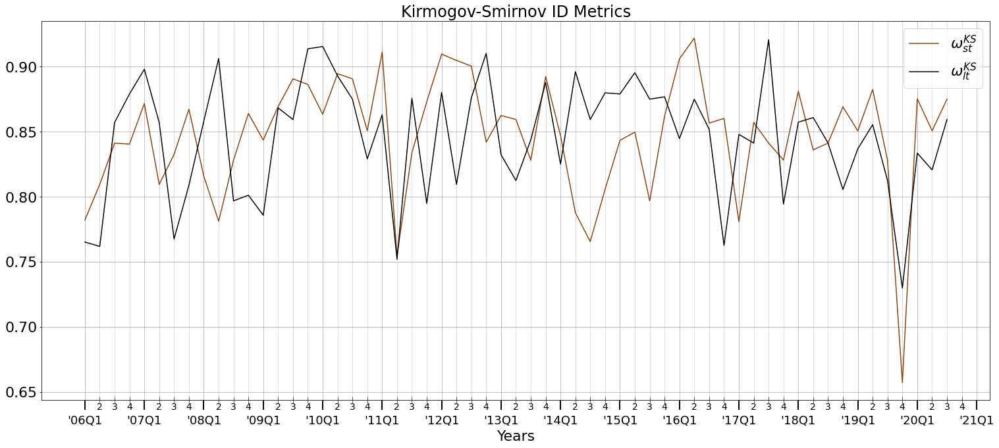

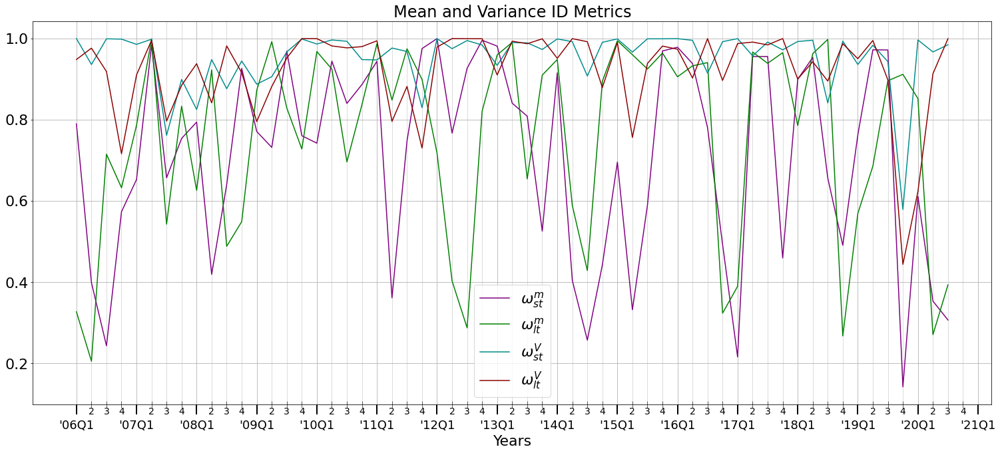

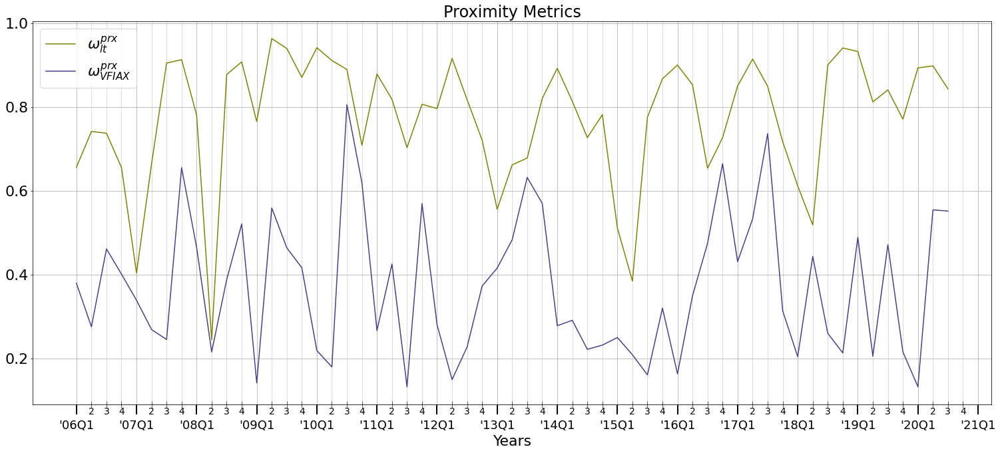

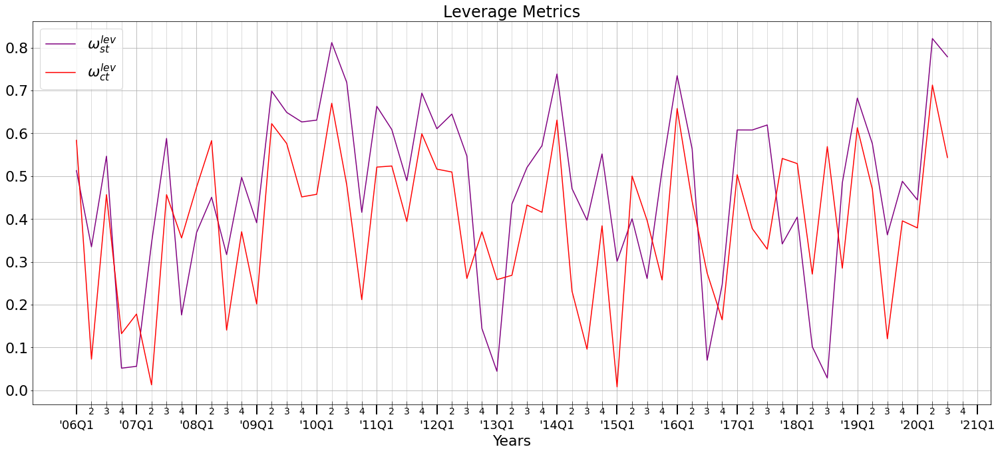

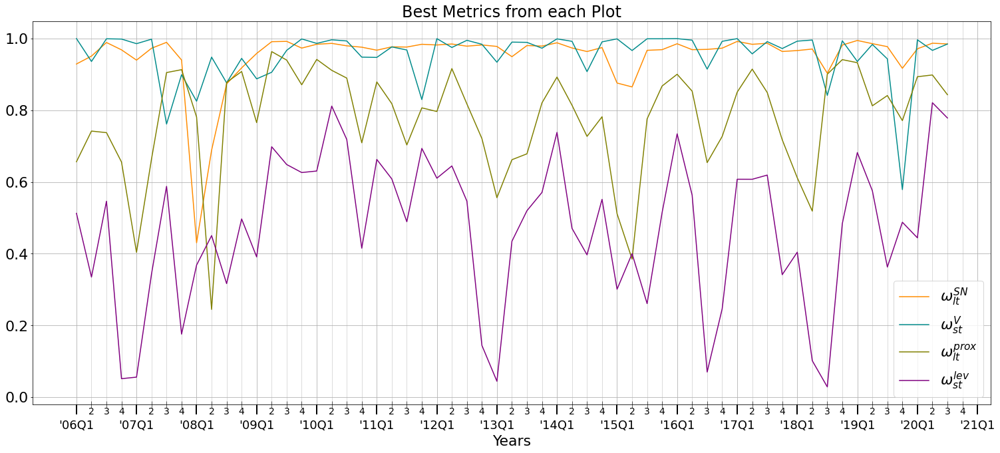

In [28]:


fig = plt.figure(2, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, w_KS_st, 'saddlebrown', label = '$\omega^{KS}_{st}$')
ax.plot(x_values, w_KS_lt, 'k', label = '$\omega^{KS}_{lt}$')
ax.set_title('Kirmogov-Smirnov ID Metrics', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\T2_KS.png')


fig = plt.figure(3, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, w_m_st, 'purple', label = '$\omega^{m}_{st}$')
ax.plot(x_values, w_m_lt, 'green', label = '$\omega^{m}_{lt}$')
ax.plot(x_values, w_V_st, 'darkcyan', label = '$\omega^{V}_{st}$')
ax.plot(x_values, w_V_lt, 'darkred', label = '$\omega^{V}_{lt}$')
ax.set_title('Mean and Variance ID Metrics', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\T2_m_and_V.png')


fig = plt.figure(4, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, w_prox_lt, 'olive', label = '$\omega^{prx}_{lt}$')
ax.plot(x_values, w_prox_VFIAX, 'darkslateblue', label = '$\omega^{prx}_{VFIAX}$')
ax.set_title('Proximity Metrics', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\T2_prox.png')

fig = plt.figure(5, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, w_lev_st, 'purple', label = '$\omega^{lev}_{st}$')
ax.plot(x_values, w_lev_ct, 'r', label = '$\omega^{lev}_{ct}$')
ax.set_title('Leverage Metrics', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\T2_lev.png')


#These are up for debate. Most of the metrics do not do a good job of indicating any event. 
fig = plt.figure(6, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, w_SN_lt, 'darkorange', label = '$\omega^{SN}_{lt}$')
ax.plot(x_values, w_V_st, 'darkcyan', label = '$\omega^{V}_{st}$')
ax.plot(x_values, w_prox_lt, 'olive', label = '$\omega^{prox}_{lt}$')
ax.plot(x_values, w_lev_st, 'purple', label = '$\omega^{lev}_{st}$')
ax.set_title('Best Metrics from each Plot', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\T2_best_metrics.png')




Task 3 starts here

In [26]:
rho_nu_ratio = []
rho_lt = []

for period in rolling_window:

    m, V = mean_and_variance[period]

    mu_mx = max(m)
    nu_si = st_params[period][3]
    sig_lt = lt_params[period][1]
    mu_lt = lt_params[period][2]

    if mu_si[period] >= mu_mx:
        rho_nu_ratio.append(0)
        rho_lt.append(0)
    else:
        rho = ((mu_lt - mu_si[period])/sig_lt)
        rho_nu_ratio.append(rho/nu_si)
        rho_lt.append(rho)

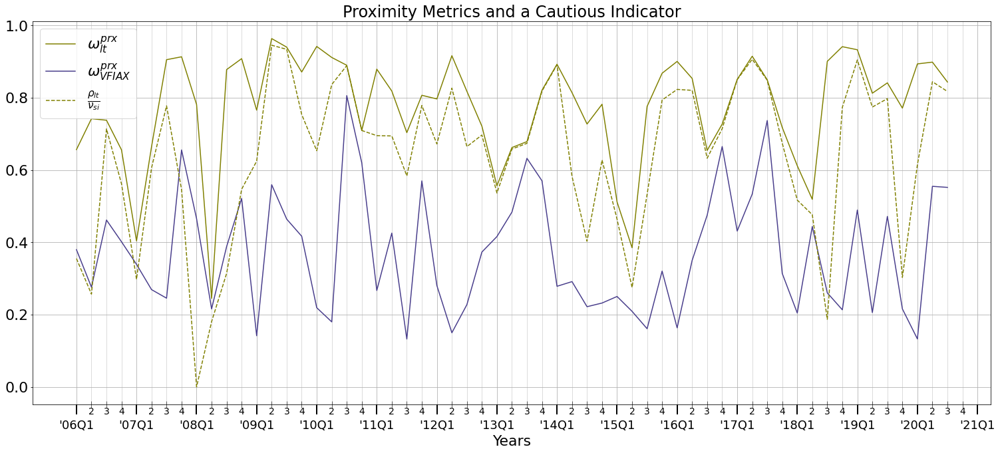

In [27]:

fig = plt.figure(7, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
label = '$\\frac{\\rho_{lt}}{\\nu_{si}}$'
ax.plot(x_values, w_prox_lt, 'olive', label = '$\omega^{prx}_{lt}$')
ax.plot(x_values, w_prox_VFIAX, 'darkslateblue', label = '$\omega^{prx}_{VFIAX}$')
ax.plot(x_values, rho_nu_ratio, 'olive', linestyle = '--', label = label)
ax.set_title('Proximity Metrics and a Cautious Indicator', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.yticks(fontsize=22)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\proxy_vs_proxim.png')


In [29]:
#computes all of the allocations and corresponding mu hats and sigma hats for the efficient long

f_lf = {}
sig_hat = {}
mu_hat = {}
interpolant_mu = {}

for period in rolling_window:
    mu_si_period = mu_si[period]
    f_lfs = []
    mu_hats = []
    sig_hats = []
    interpolant_mus = []

    m, V = mean_and_variance[period]

    ## Going to be called a lot, saves time to compute before hand
    m_len = len(m)
    V_len = len(V)
    ones_vec = np.ones_like(m_len)
    mu_hats_eqn_scnd_term = (m - mu_si_period * ones_vec).T

    # Store the f_lt as well for easy computing chi_opt
    _, sigma_lt, mu_lt, nu_lt = lt_params[period]
    f_lfs.append(f_lt[period])
    mu_hats.append(mu_lt)
    sig_hats.append(sigma_lt)

    # Long Frontier qaudprog parameters
    Q = matrix(V.values, tc='d')
    z = matrix(np.zeros(V_len).tolist(), tc='d')
    I = matrix((-1*np.identity(V_len)), tc='d')
    A = matrix(np.array([np.ones(V_len).tolist(), m.values.tolist()]), tc='d')

    # Setting up interpolation values
    min_mu = m.min()
    max_mu = m.max()
    step_size = (max_mu-min_mu)/300
    long_mus = np.arange(min_mu, max_mu + step_size, step_size)
    prev_mu = long_mus[0]
    long_mus = long_mus[1:]

    # Long Frontier qaudprog solutions
    deq = matrix(np.array([1, prev_mu]), tc='d')
    sol = solvers.qp(Q, z, I, z, A, deq)
    prev_long_allocation = np.reshape(np.array(sol['x']), m_len)

    for cur_mu in long_mus:

        deq = matrix(np.array([1, cur_mu]), tc='d')
        f = np.array(solvers.qp(Q, z, I, z, A, deq)['x'])
        cur_long_allocation = np.reshape(f, m_len)

        # Establish the range over which I will interpolate.
        step_size = cur_mu-prev_mu
        interpolant_steps = step_size/30
        mu_range = np.arange(prev_mu, cur_mu + interpolant_steps, interpolant_steps)

        # Linear interpolation between allocations for 2 mus (Long frontier)
        for mu in mu_range:
            f = ((cur_mu - mu)/step_size)*prev_long_allocation + ((mu - prev_mu)/step_size)*cur_long_allocation
            f_lfs.append(f)
            sig_hats.append(np.sqrt(f.T @ V @ f))
            mu_hats.append(mu_si_period + (mu_hats_eqn_scnd_term @ f))
            interpolant_mus.append(mu)

        prev_mu = cur_mu
        prev_long_allocation = cur_long_allocation

    f_lf[period] = f_lfs
    sig_hat[period] = sig_hats
    mu_hat[period] = mu_hats
    interpolant_mu[period] = interpolant_mus

In [32]:
chis = []
chi_choice = {}
#zetas = np.array([0.0, .0625, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 1.0])
step_size = 1/16
zetas = np.arange(0, 1+step_size, 1/16)
rhos = np.array(rho_lt)


array([0.    , 0.0625, 0.125 , 0.1875, 0.25  , 0.3125, 0.375 , 0.4375,
       0.5   , 0.5625, 0.625 , 0.6875, 0.75  , 0.8125, 0.875 , 0.9375,
       1.    ])

In [33]:
for zeta in zetas:
    chis.append(zeta*rhos)

for idx, chi in enumerate(chis):
    chi_year = zip(chi, rolling_window)

    for chi_yr, period in chi_year:

        mu_sig_zip = zip(mu_hat[period], sig_hat[period], f_lf[period])
        mu, sig, f = next(mu_sig_zip)
        chi_choice[idx, period] = mu, sig, f
        gamma = np.log(1+mu) - (sig**2)/2 - chi_yr*sig

        for mu, sig, f in mu_sig_zip:
            gamma_cur = np.log(1+mu) - (sig**2)/2 - chi_yr*sig
            if gamma_cur > gamma:
                gamma = gamma_cur
                chi_choice[idx, period] = mu, sig, f



In [35]:

#for each of the firt 56 periods, determine which of the nine f^chi_mx maximizes it based on the return of that f^\chi
# allocation for the quarter and interest rate immediately suceeding the end of that one year window
#sum_{d=1}^D (log(1+r(d,f))). We want to use one year's worth of data to test the next quarter return.


#This produces periods of one quarter long from 2007Q1 to 2020Q4.   
testing_quarters = []

for year in years[:15]:
    for q_idx, (q_start, q_end) in enumerate(quarter_pairs):
        period_end = year[:4] + q_end
        period_start = year[:4] + q_start
        testing_quarters.append((period_start, period_end))
testing_quarters = testing_quarters[2:]

#I made this list so i could get the mu_si for the next quarter
period_list = []
for period_idx, (period_start, period_end) in enumerate(rolling_window):
    period_list.append((period_start, period_end))



In [45]:
chi_opt = pd.Series(index=rolling_window, dtype= np.float64)
chi_opt_zeta = pd.Series(index=rolling_window, dtype= np.float64)
chi_opt_zero = pd.Series(index=rolling_window, dtype= np.float64)
chi_opt_zeta_zero = pd.Series(index=rolling_window, dtype= np.float64)
growth_chi_opt = pd.Series(index=rolling_window, dtype= np.float64)
growth_chi_opt_zero = pd.Series(index=rolling_window, dtype= np.float64)
f_mx_chi_plot = {}
growth_VFIAX = pd.Series(index=rolling_window, dtype= np.float64)

for period_idx, (period_start, period_end) in enumerate(rolling_window):
    if period_idx<58:
        period = (period_start, period_end)
        #This part puts the f^chi_mx values into a list.
        f_chi_mx=[]
        f_chi_mx_zero = []

        for idx in range(0,17):
            f_chi = chi_choice[idx, period][2]
            if idx < 16:
                f_chi_mx_zero.append(f_chi)
            f_chi_mx.append(f_chi)
        f_chi_mx_zero.append(np.zeros((9, )))

        #This gets the returns of the next quarter
        test_q_start, test_q_end = testing_quarters[period_idx]
        returns = groupABC.returns[test_q_start:test_q_end]

        #This gets the rf rate for the next quarter
        mu_si_val = mu_si[period_list[period_idx+1]]
        ones_vec = np.ones_like(len(returns))
        reused_term = (returns - mu_si_val*ones_vec)

        VFIAX_returns = groupABC.returns['VFIAX'][test_q_start:test_q_end]
        growth_VFIAX[period] = np.log(ones_vec+VFIAX_returns).sum()

        growth = []
        for index in range(0,17):
            portfolio_returns = mu_si_val + (reused_term @ f_chi_mx[index])
            growth.append((np.log(ones_vec+portfolio_returns)).sum())
        zeta_value = np.argmax(growth)
        chi_opt[period] = chis[zeta_value][period_idx]
        chi_opt_zeta[period] = zetas[zeta_value]/4
        growth_chi_opt[period] = growth[zeta_value]

        growth = []
        for index in range(0,17):
            portfolio_returns = mu_si_val + (reused_term @ f_chi_mx_zero[index])
            growth.append((np.log(ones_vec+portfolio_returns)).sum())
        zeta_value = np.argmax(growth)

        chi_opt_zero[period] = chis[zeta_value][period_idx]
        chi_opt_zeta_zero[period] = zetas[zeta_value]/4
        growth_chi_opt_zero[period] = growth[zeta_value]
        mu= chi_choice[zeta_value, period][0]
        sig = chi_choice[zeta_value, period][1]
        f_mx_chi_plot[period] = mu, sig



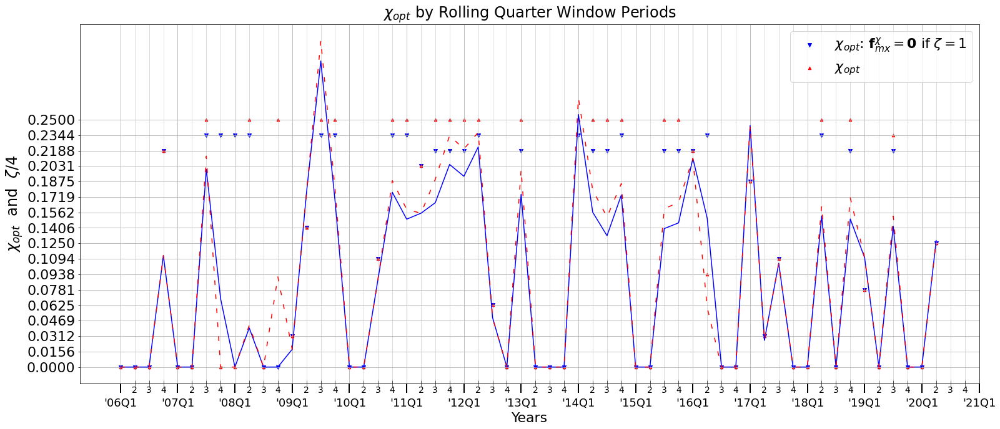

In [46]:
fig = plt.figure(9, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.scatter(x_values, chi_opt_zeta_zero, label = '$\chi_{opt}$'+ ': ' '$\mathbf{f}_{mx}^{\chi}=\mathbf{0}$'+' if '+ '$\zeta=1$', color = 'b', marker = 'v')
ax.scatter(x_values, chi_opt_zeta, label = '$\chi_{opt}$', color = 'r', marker = '^', s = 20)
ax.plot(x_values, chi_opt_zero, color = 'b')
ax.plot(x_values, chi_opt, color = 'r', linestyle= (0, (5, 10)))
ax.set_title('$\chi_{opt}$ by Rolling Quarter Window Periods', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,60,16),0))
ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.ylabel('$\chi_{opt}$'+'  and  '+'$\zeta$/4', fontsize=24)
plt.yticks(zetas/4, fontsize=22)
plt.legend(loc='best', fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\chi_opt_comparison.png')

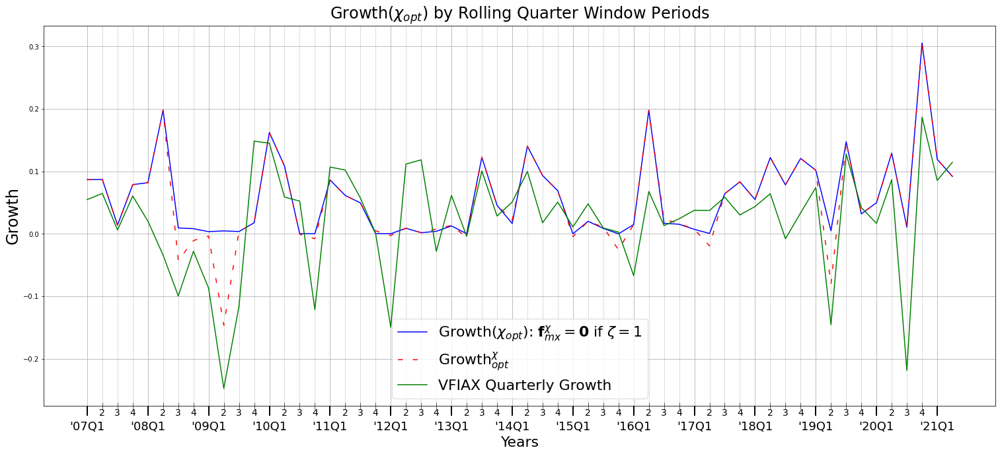

In [47]:
fig = plt.figure(10, (25,10))
ax = fig.add_axes([0.1,0.1,.8,.8])
ax.plot(x_values, growth_chi_opt_zero, label = 'Growth($\chi_{opt})$'+ ': ' '$\mathbf{f}_{mx}^{\chi}=\mathbf{0}$'+' if '+ '$\zeta=1$', color = 'b')
ax.plot(x_values, growth_chi_opt, label = 'Growth$^\chi_{opt}$', color = 'r', linestyle= (0, (5, 10)))
ax.plot(x_values, growth_VFIAX, label = 'VFIAX Quarterly Growth', color = 'g')
ax.set_title('Growth($\chi_{opt}$) by Rolling Quarter Window Periods', fontsize=24)
ax.set_xticks(np.round(np.linspace(0,56,15),0))
ax.set_xticklabels(first_quarter_x_ticks[1:], fontsize = 18)
ax.set_xticks(np.round(np.linspace(0,56,57),0), minor = True)
ax.set_xticklabels(x_ticks[4:], fontsize=14, minor = True)
ax.grid(which = 'both')
ax.tick_params(axis = 'x', which = 'major', pad = 8, length = 15, width = 2)
ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .55, direction = 'inout', length = 10)
plt.xlabel('Years', fontsize=22, labelpad = 5)
plt.ylabel('Growth', fontsize=24)
plt.legend(loc='best', fontsize=22)

### FIX THIS LABEL

#plt.yticks(zetas/4, fontsize=22)
plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\chi_opt_returns.png')


In [39]:
from matplotlib.lines import Line2D

rf = Line2D([0], [0], marker='D', color='w', markerfacecolor='k', label='Risk Free Rates', markersize=14)
ltg = Line2D([0], [0], marker='v', color='k', markerfacecolor='r', label='Long Tangent Portfolio', markersize=14)
efficient_frontier = Line2D([0], [0], linestyle='--', linewidth=1., color='r', label='Efficient Frontier', markersize=14)
long_frontier = Line2D([0], [0], linestyle='solid', linewidth=1., color='k', label='Long Frontier', markersize=14)
chi_opt_port = Line2D([0], [0], marker = '^', markerfacecolor='b', color = 'k', label = '$f^{\chi}_{mx}$ Allocation', markersize=14)
chi_opt_port_bst = Line2D([0], [0], marker = '*', markerfacecolor='g', color = 'k', label = '$f^{\chi}_{mx}$ for $\chi_{opt}$', markersize=17)
assets = Line2D([0], [0], marker='o', color='w', markerfacecolor='k', label='Assets', markersize=14)


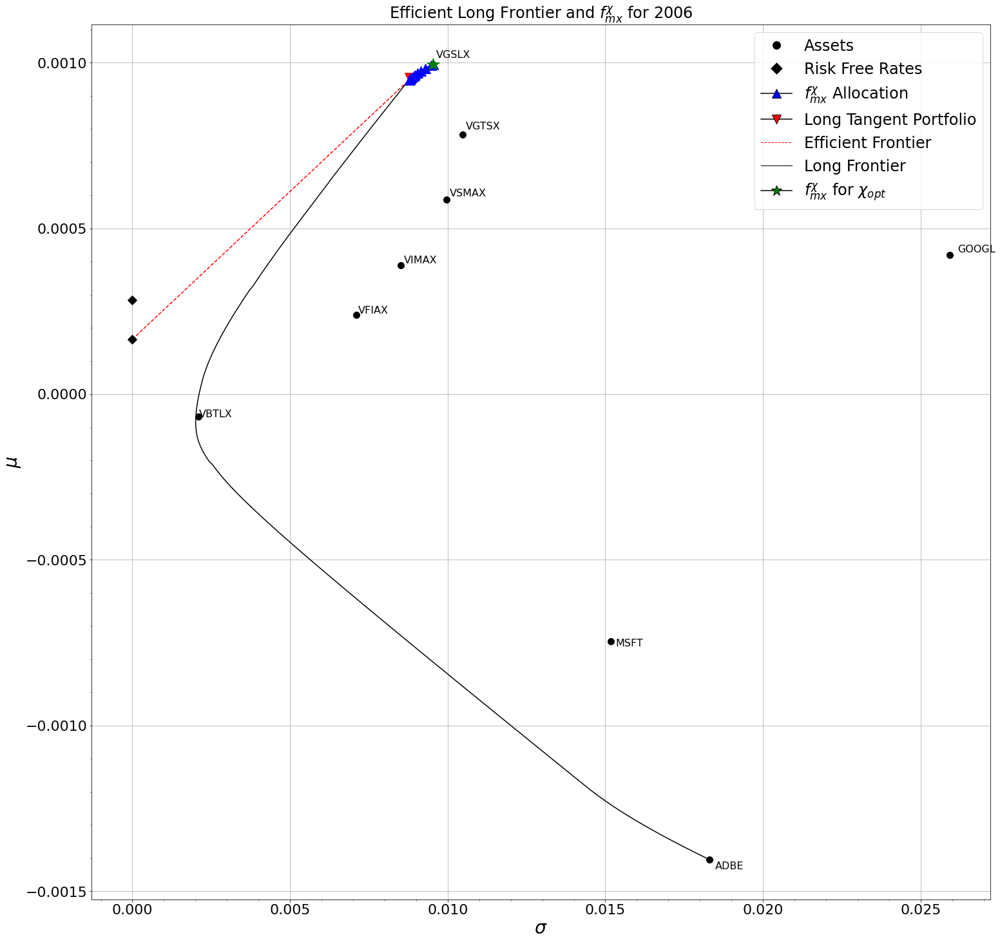

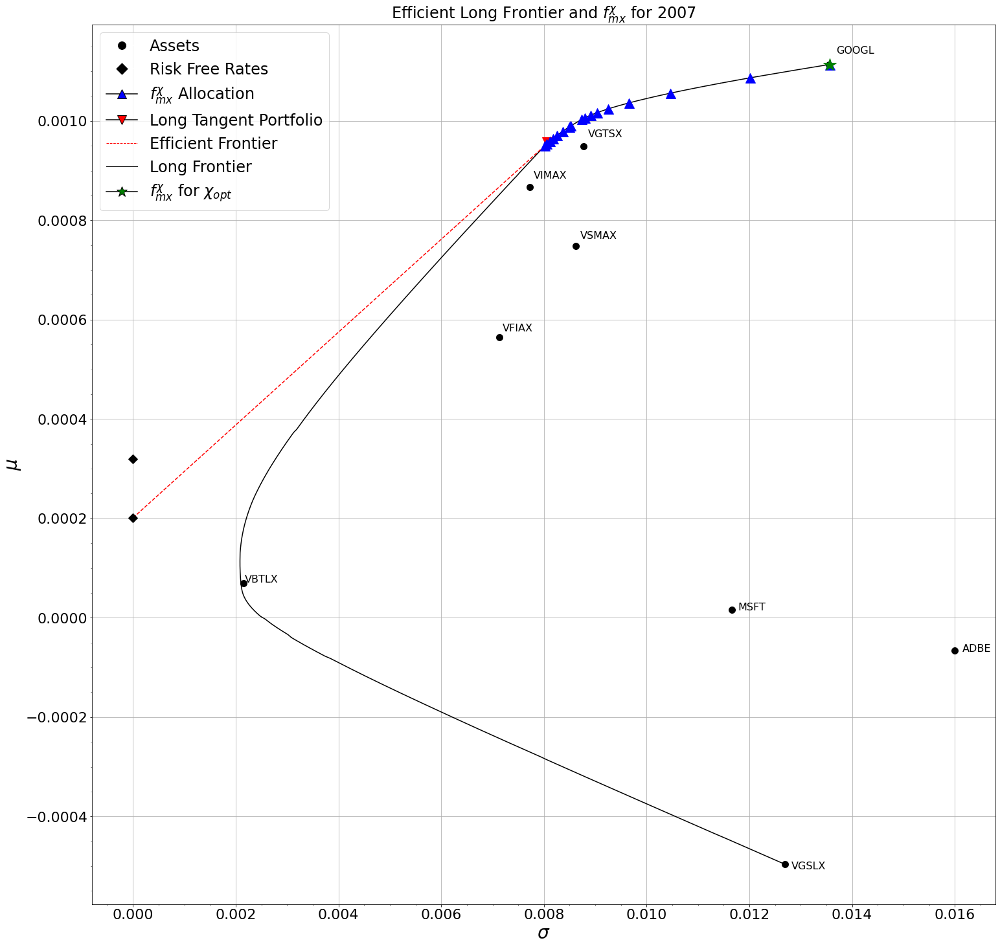

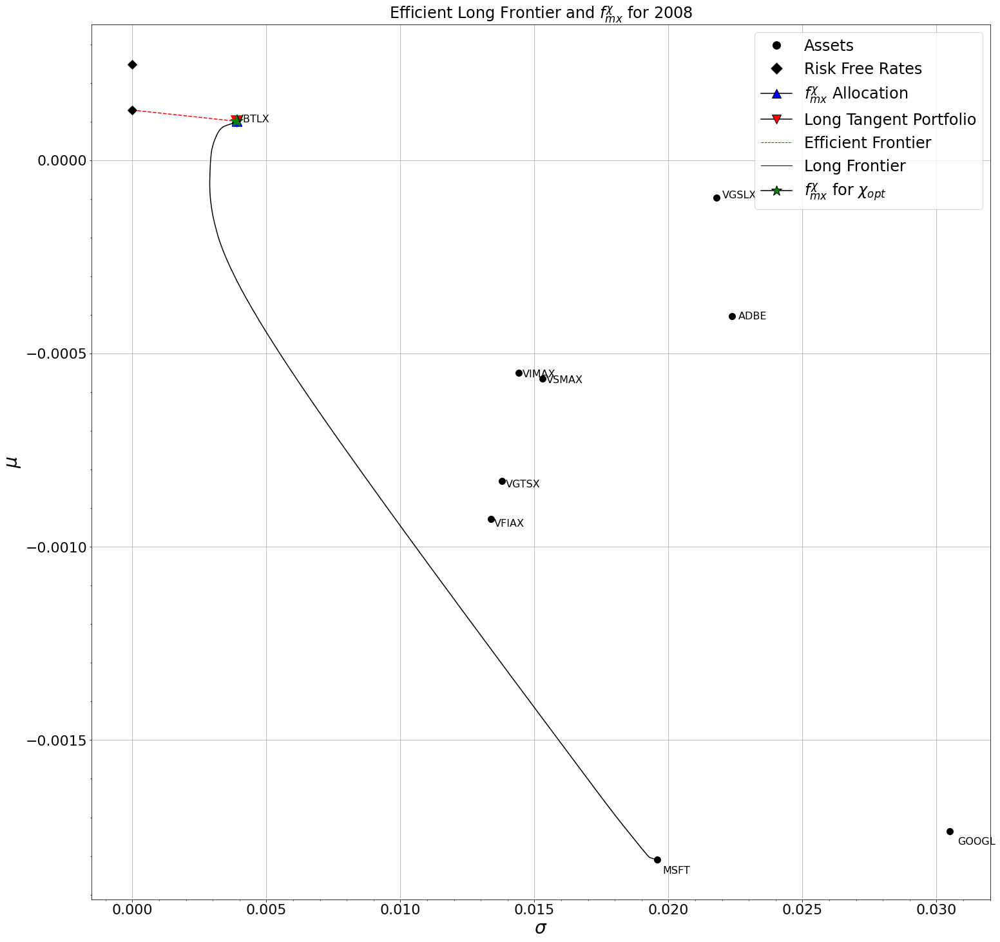

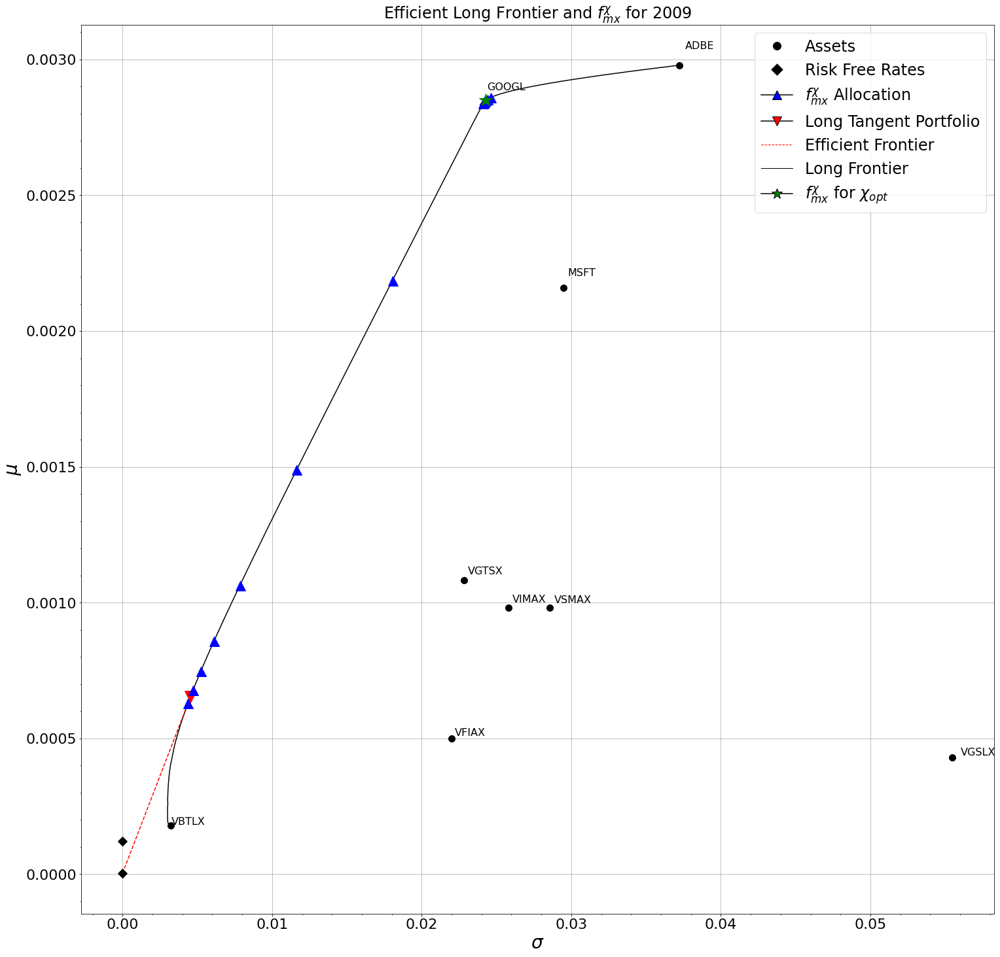

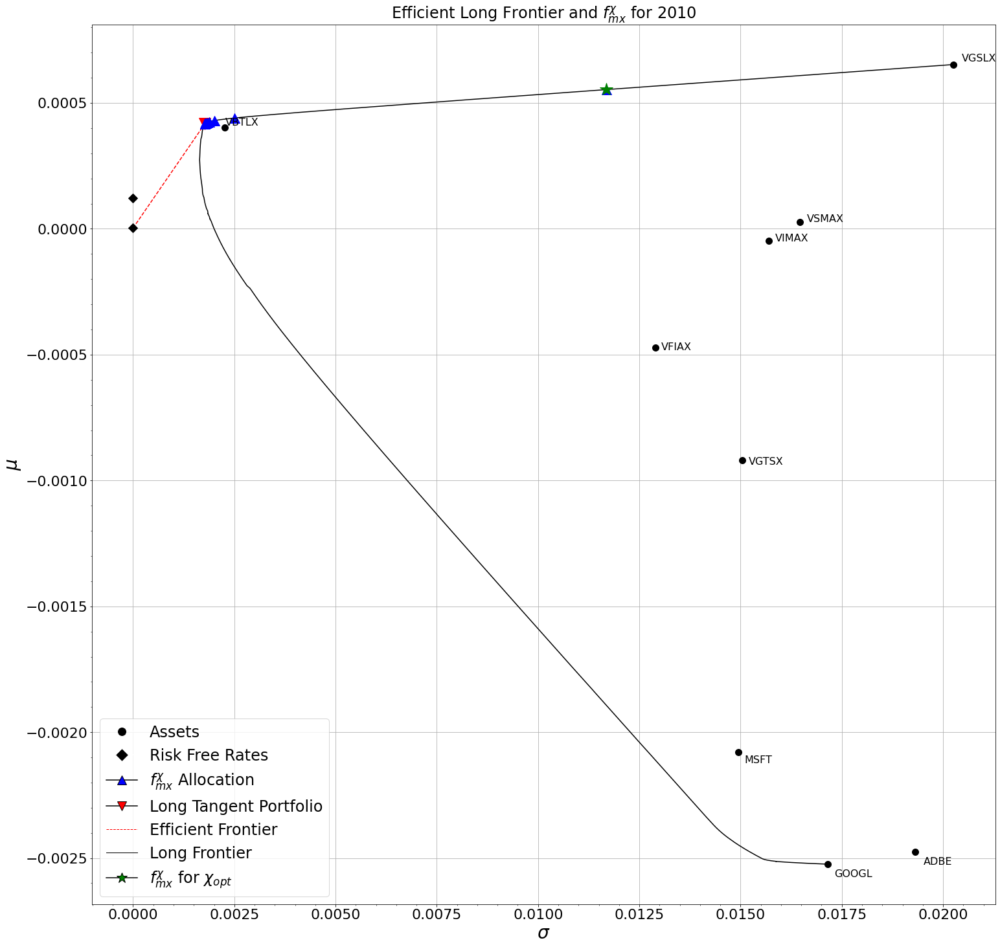

...

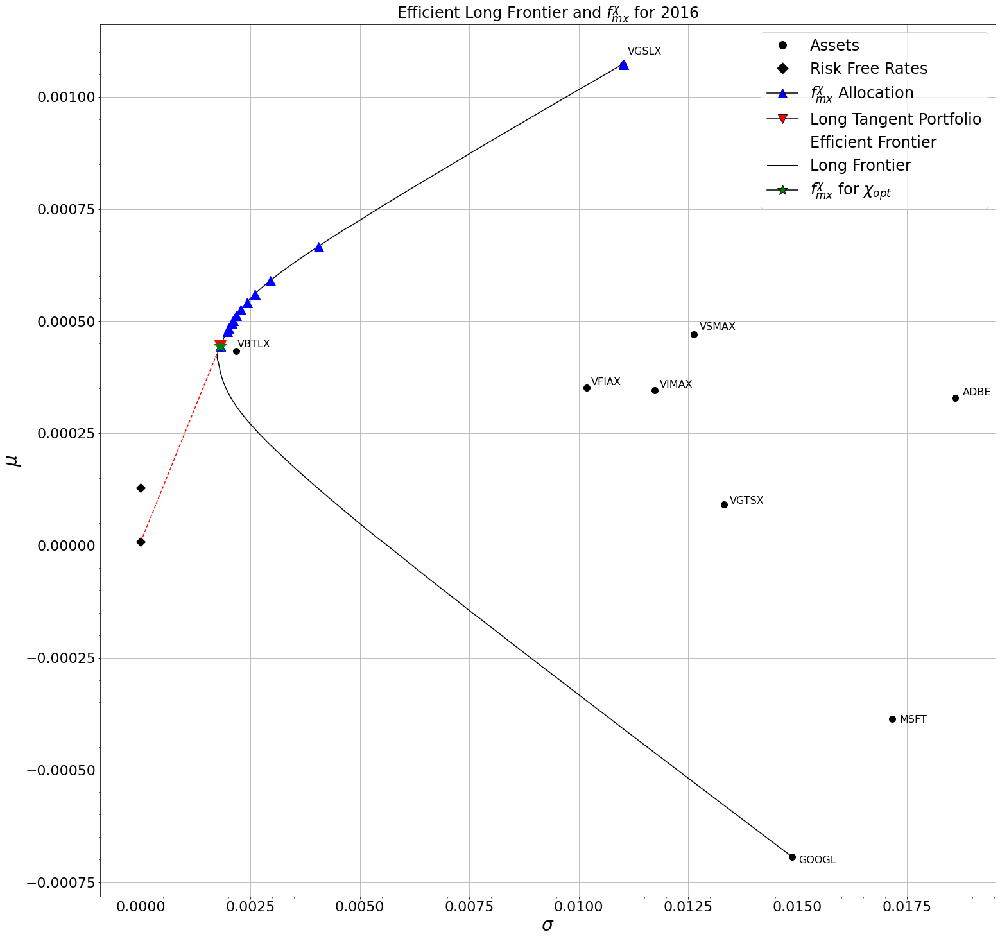

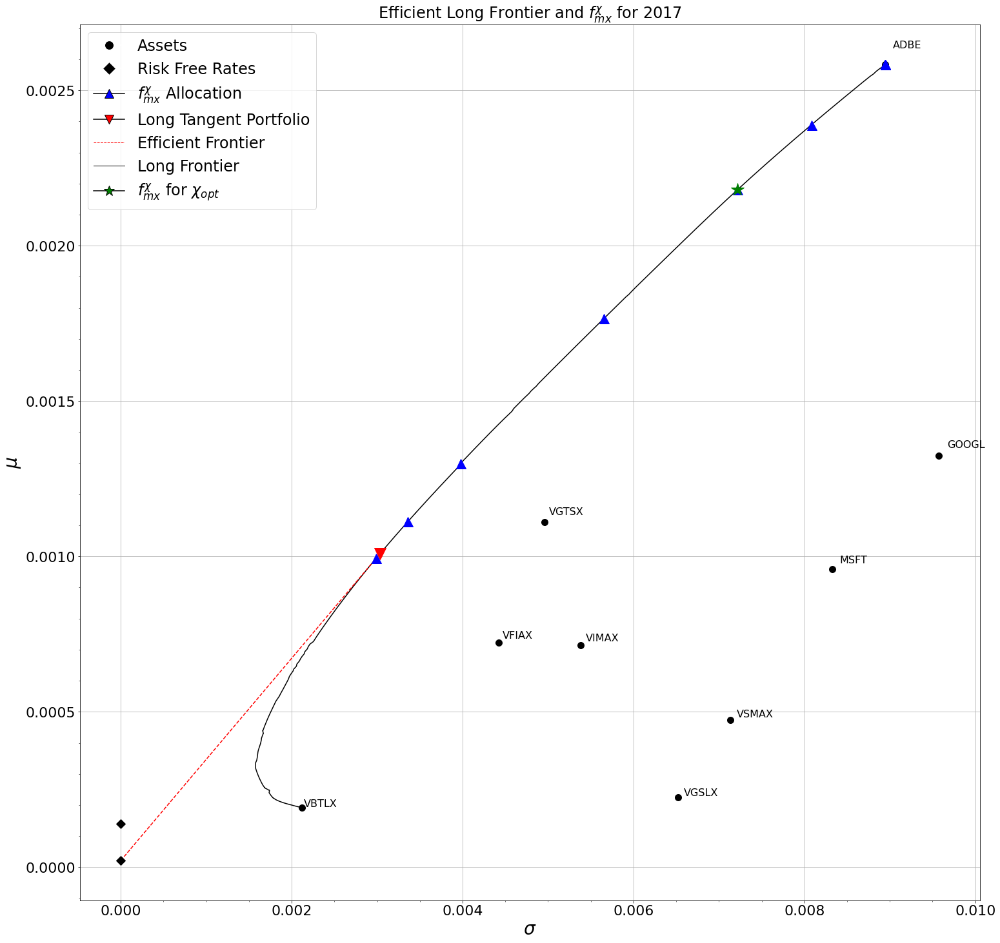

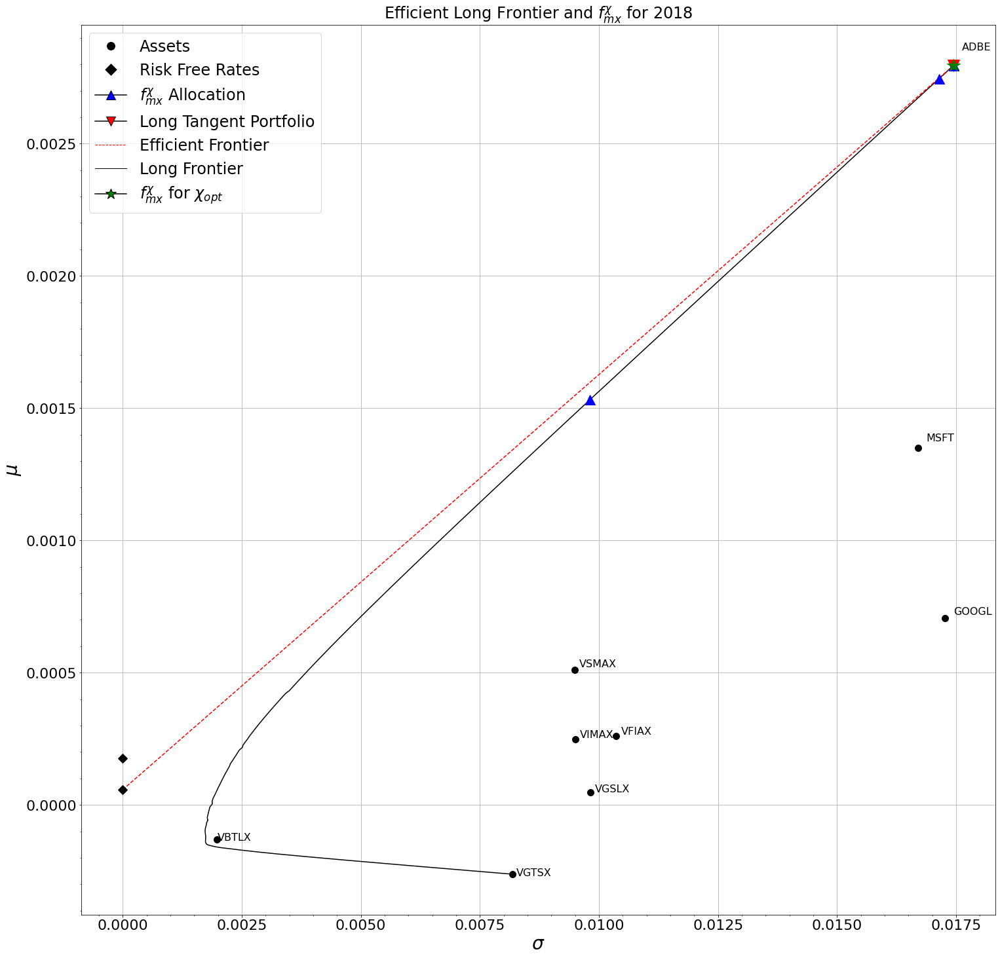

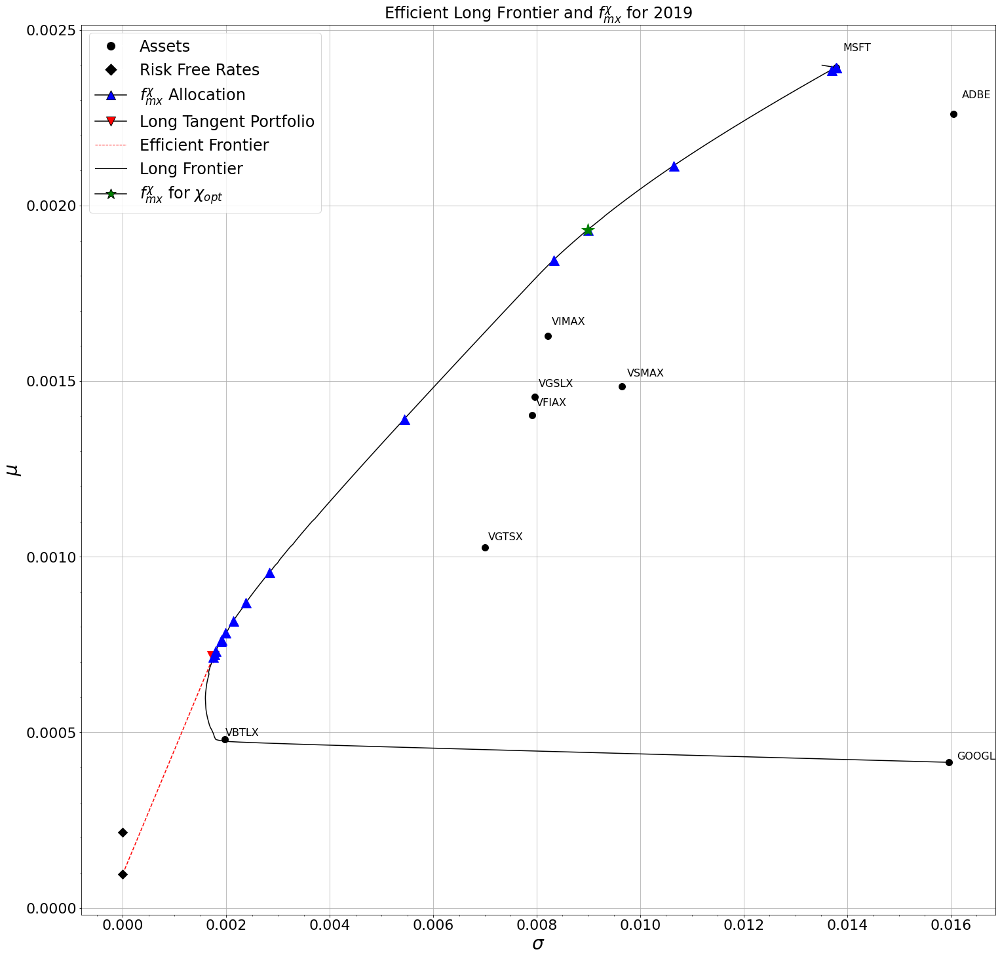

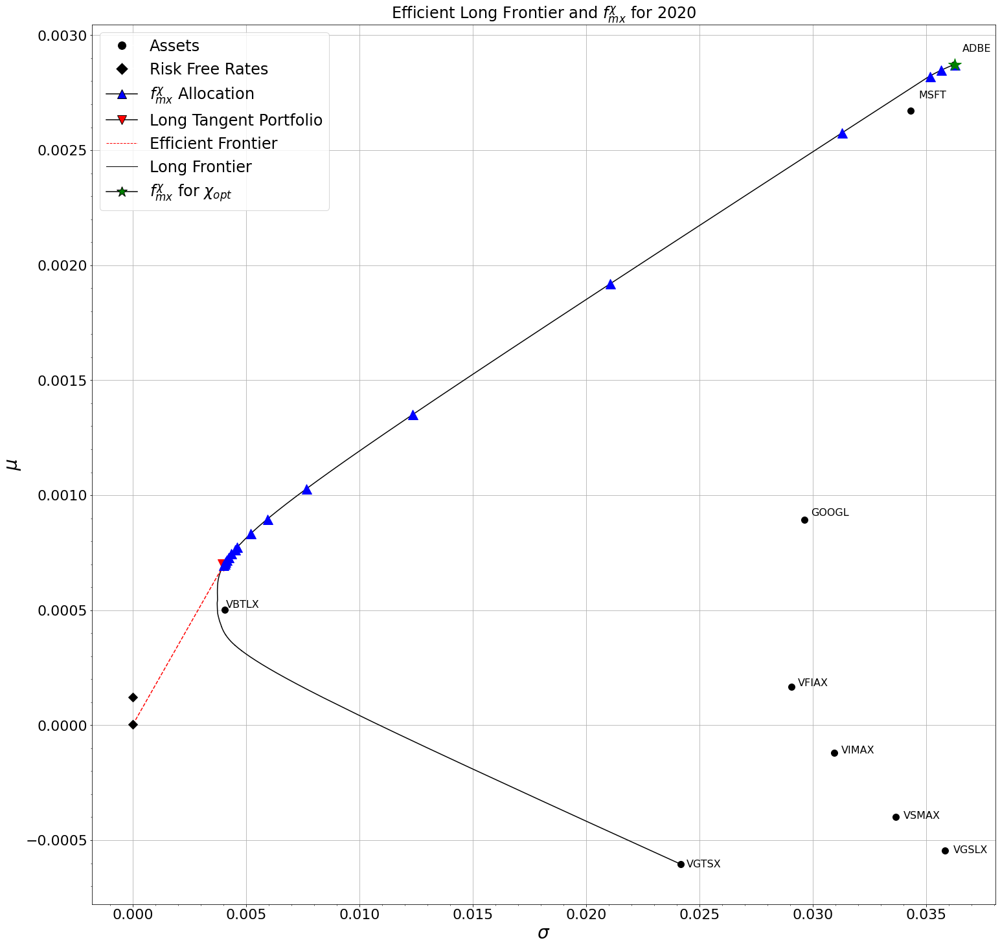

In [49]:

#plot the nine points

for period_idx, (period_start, period_end) in enumerate(rolling_window):
    if period_idx%4 == 0:
        period = (period_start, period_end)
        plt.figure(period_idx, (25,25))

        # Plot long frontier linear interpolation
        plt.plot(sig_hat[period][1:], interpolant_mu[period],  color='k', linestyle= 'solid')
        m, V = mean_and_variance[period]


        # Plot the portfolio assets and the labels
        for j in range(len(m)):
            plt.plot(V.iloc[j,j]**0.5, m[j], color = 'k', marker = 'o', markersize = 10)
            plt.annotate(V.index[j], (1.01*V.iloc[j,j]**0.5, 1.02*m[j]), fontsize=16)

        # Plot long tangent portfolio and and the efficient frontier
        _, sigma_lt, mu_lt, nu_lt = lt_params[period]
        plt.plot(sigma_lt, mu_lt, color='r', marker= 'v', markersize = 18)
        plt.plot([0, sigma_lt], [mu_si[period], mu_lt], color='r', linestyle = '--')


        mu = np.zeros((17,1))
        sig = np.zeros((17,1))
        # Plotting the Nine f_mx^\chi
        for idx in range(0,17):
            plt.plot(chi_choice[idx, period][1], chi_choice[idx, period][0], marker = '^', markersize = 15, color = 'b')

        # Plot the f_mx^\chi_opt
        if period != ('2020-07-01', '2020-12-31'):
            mu, sig = f_mx_chi_plot[period]
            plt.plot(sig, mu, marker = '*', color = 'g', markersize = 20)

        #plot risk free rates
        plt.plot(0, mu_si[period], marker = 'D', color = 'k', markersize = 10)
        plt.plot(0, mu_cl[period], marker = 'D', color = 'k', markersize = 10)


        year = period_start[:4]
        plt.title('Efficient Long Frontier and $f^{\chi}_{mx}$ for ' + year, fontsize = 24)
        plt.legend(loc='best', ncol=1, handles=[assets, rf, chi_opt_port, ltg, efficient_frontier, long_frontier, chi_opt_port_bst], fontsize= 24)
        plt.xlabel('$\sigma$', fontsize=28)
        plt.ylabel('$\mu$', fontsize=28)
        plt.grid()
        plt.minorticks_on()
        plt.yticks(fontsize=22)
        plt.xticks(fontsize=22)
        #plt.ylim(min_mu*1.1, max_mu*1.1)
        #plt.xlim(0, sigma_lim[0]*1.1)
        plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\f_chi_mx_plot' + year + '.png')
        plt.show()




Task 4 starts here

1
w_SN_lt+w_KS_st+w_prox_lt+w_lev_ct
                            OLS Regression Results                            
Dep. Variable:                    CHI   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     2.455
Date:                Mon, 24 May 2021   Prob (F-statistic):             0.0370
Time:                        22:43:08   Log-Likelihood:                 64.836
No. Observations:                  57   AIC:                            -115.7
Df Residuals:                      50   BIC:                            -101.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
I

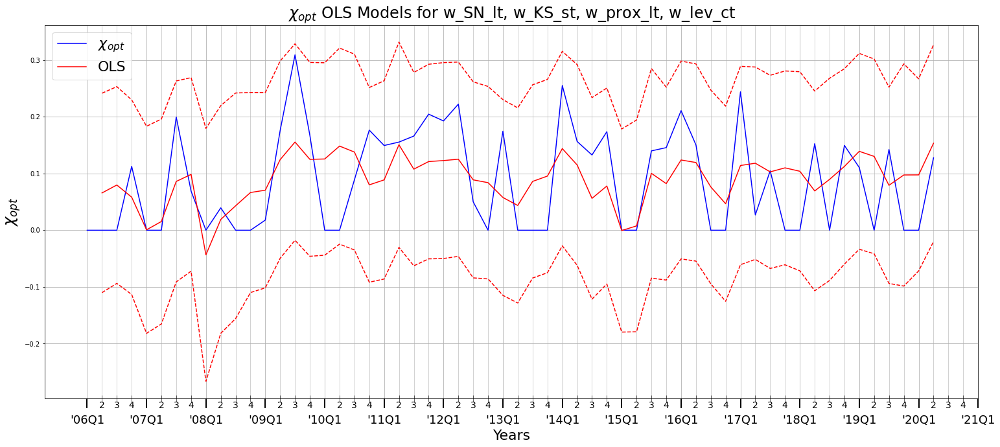

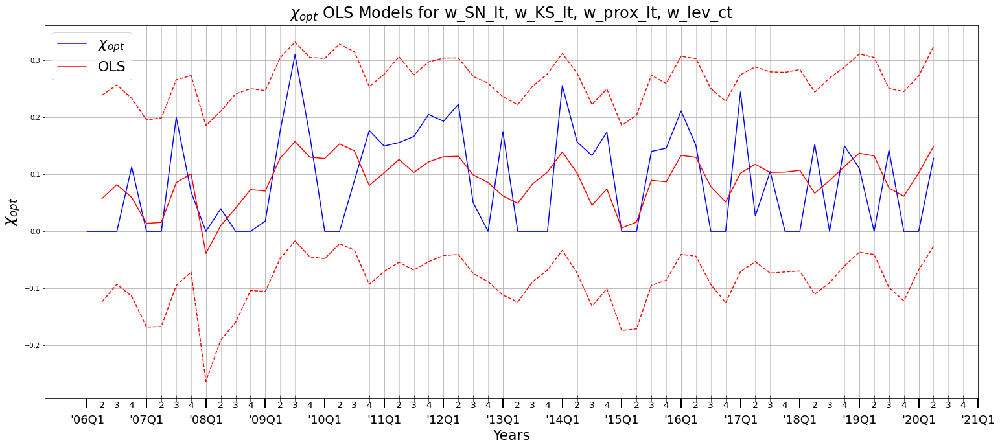

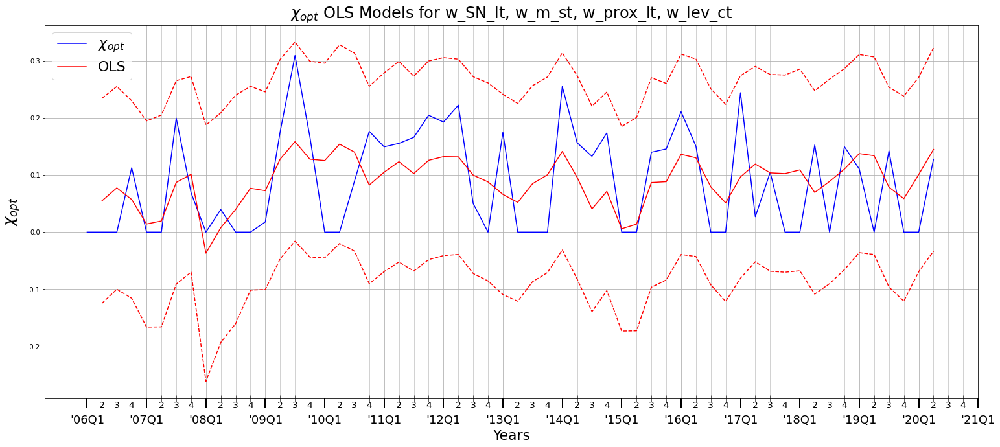

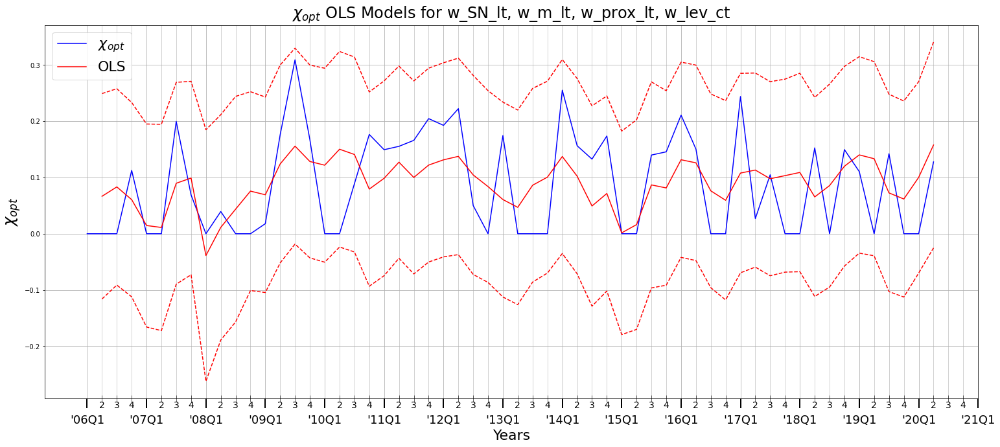

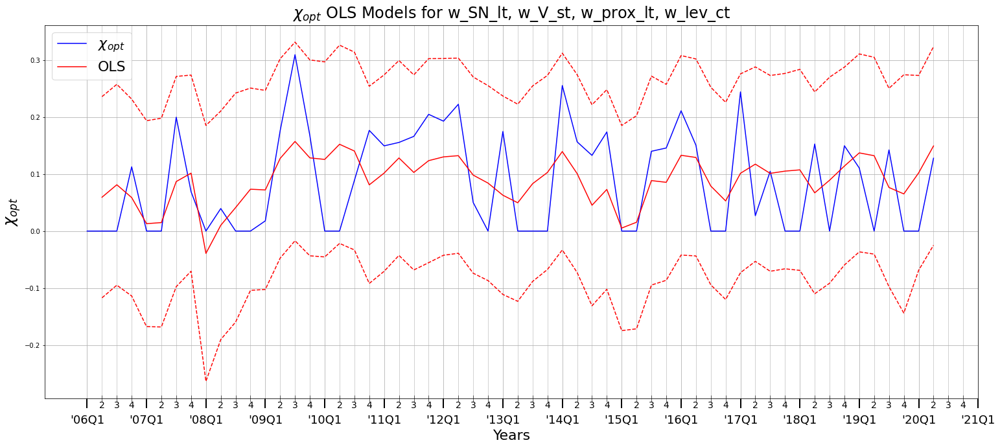

...

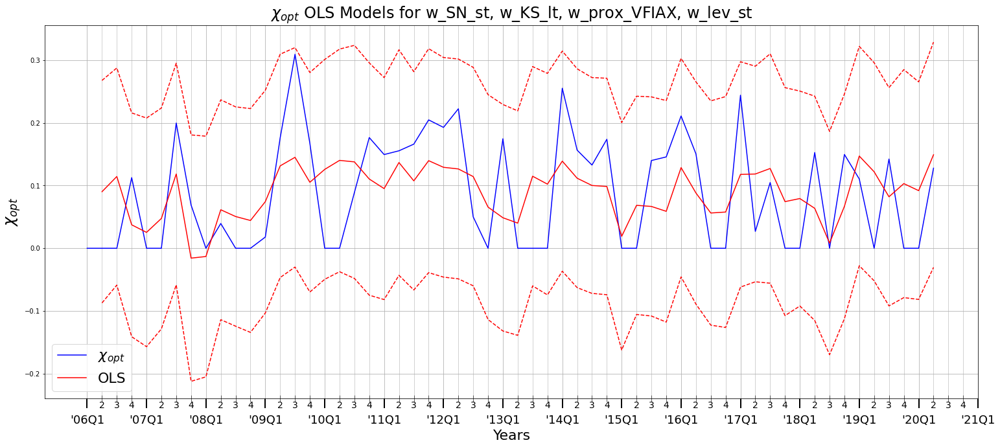

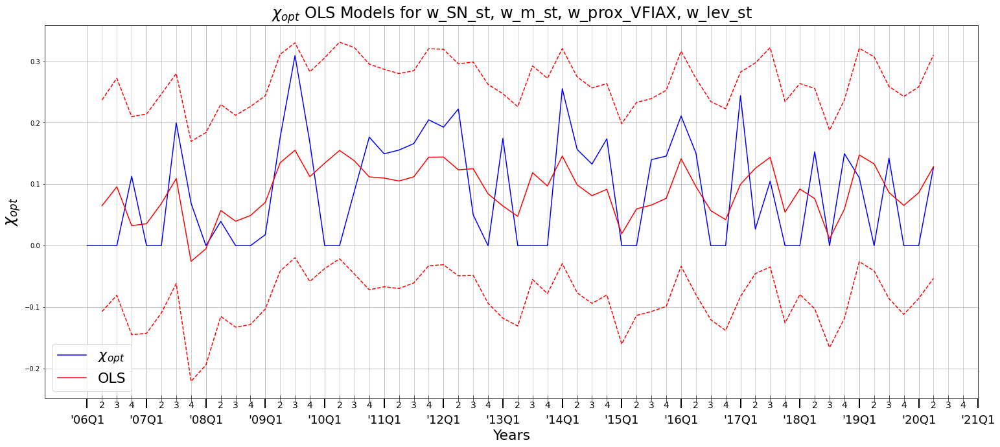

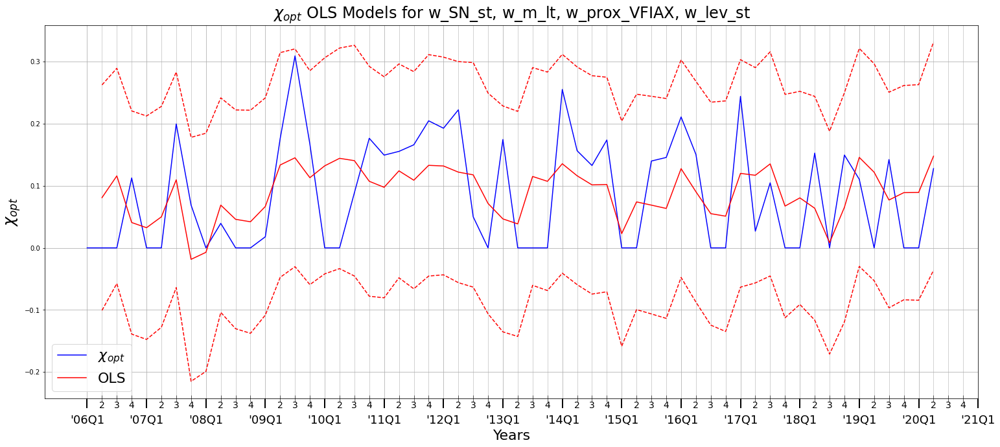

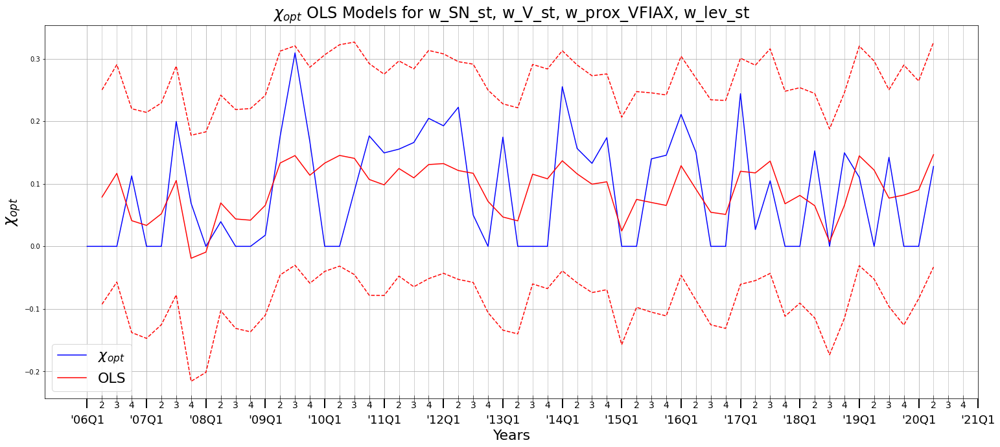

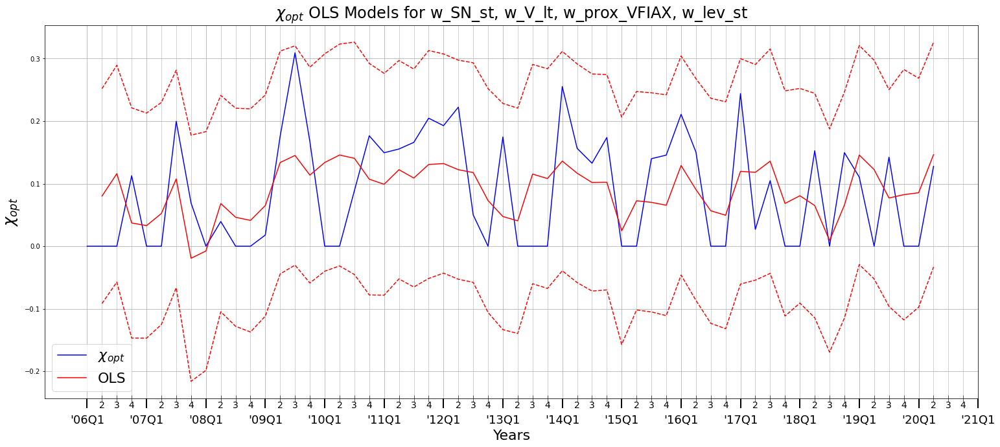

In [51]:
idx = 1
for testing in product(SN_metrics.keys(),  prox_metrics. keys(), lev_metrics.keys(), ID_metrics.keys()):
    print(idx)
    idx+=1
    print(testing[0] +'+'+ testing[3] +'+'+ testing[1] +'+'+ testing[2])

    metric_data = {}
    metric_data['$\chi_{opt}$'] = chi_opt_zero[1:58].reset_index(drop=True)
    metric_data[testing[0]] = SN_metrics[testing[0]][1:58].reset_index(drop=True)
    metric_data[testing[3]] = ID_metrics[testing[3]][1:58].reset_index(drop=True)
    metric_data[testing[1]] = prox_metrics[testing[1]][1:58].reset_index(drop=True)
    metric_data[testing[2]] = lev_metrics[testing[2]][1:58].reset_index(drop=True)
    metric_data[testing[1]+'_minus_1'] = prox_metrics[testing[1]][0:57].reset_index(drop=True)
    metric_data[testing[2]+'_minus_1'] = lev_metrics[testing[2]][0:57].reset_index(drop=True)

    fitting_df = pd.DataFrame(metric_data)

    CHI =fitting_df['$\chi_{opt}$']

    mod = sm.ols(formula='CHI~'+testing[0] +'+'+ testing[3] +'+'+ testing[1] +'+'+ testing[1]+'_minus_1' +'+'+ testing[2] +'+'+ testing[2]+'_minus_1', data=fitting_df)
    res =mod.fit()

    print(res.summary(),'\n\n\n'+'Next results:')
    #params  = pd.DataFrame(results.params)
    #print('Parameters: ', params)
    #params


    prstd, iv_l, iv_u = wls_prediction_std(res)
    fig = plt.figure(11, (25,10))
    ax = fig.add_axes([0.1,0.1,.8,.8])
    ax.plot(x_values, chi_opt_zero, color = 'b', label = '$\chi_{opt}$')
    ax.plot(x_values[1:58], res.fittedvalues, 'r', label="OLS")
    ax.plot(x_values[1:58], iv_u, 'r--')
    ax.plot(x_values[1:58], iv_l, 'r--')
    ax.set_title('$\chi_{opt}$ OLS Models for '+testing[0]+', '+testing[3]+', '+testing[1]+', '+testing[2], fontsize=24)
    ax.set_xticks(np.round(np.linspace(0,60,16),0))
    ax.set_xticklabels(first_quarter_x_ticks, fontsize = 18)
    ax.set_xticks(np.round(np.linspace(0,60,61),0), minor = True)
    ax.set_xticklabels(x_ticks, fontsize=14, minor = True)
    ax.grid(which = 'both')
    ax.tick_params(axis = 'x', which = 'major', pad = 10, length = 15, width = 2)
    ax.tick_params(axis = 'x', which = 'minor', pad = -1, grid_alpha  = .7, direction = 'inout', length = 10)
    plt.xlabel('Years', fontsize=22, labelpad = 5)
    plt.ylabel('$\chi_{opt}$', fontsize=24)
    plt.legend(loc='best', fontsize=22)
    #plt.xticks(first_quarter_x_values, years, fontsize=22)
    plt.savefig('C:\\Users\\Tutrie\\Documents\\AMSC420\\Part 2\\Group Work\\graphs\\OLS Models for' +testing[0]+', '+testing[3]+', '+testing[1]+', '+testing[2]+ '.png')

    plt.show()



In [ ]:
res.summary().tables[0]